# Computer Vision Generator
---

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2023 <br>

## 1. About the project

The **Computer Vision Generator** project is designed to explore the capabilities of large language models (LLMs) in the field of image and video generation. The goal of this notebook (**Video Generator**) is to create a script that receive either a textual description of a video or an image and the description and generate the corresponding video. This process will be conducted with the use of pretrained models for video processing from [huggingface](https://huggingface.co/).

By leveraging the power of LLMs, specifically trained for image synthesis, the script interprets natural language prompts and translates them into detailed, accurate images. This project showcases the potential of AI to bridge the gap between language and vision, enabling the seamless conversion of ideas into visuals. The use cases for such a system are vast, ranging from creative arts and media production to education and design. By automating the process of image creation based on descriptions, the **Computer Vision Generator** opens up new possibilities for users to bring their ideas to life quickly and efficiently.

## 2. Libraries

In [1]:
# Pytorch
import torch

# Image retrieval and manipulation
from PIL import Image
import os

# Video export and display
from diffusers.utils import export_to_video
from IPython.display import Video, display
import glob

# Video Generation
from diffusers import CogVideoXImageToVideoPipeline
from diffusers import I2VGenXLPipeline
from diffusers import StableVideoDiffusionPipeline
from diffusers import AnimateDiffPipeline, MotionAdapter

# Schedulers
from diffusers import LCMScheduler

2024-10-01 21:20:47.389420: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-01 21:20:47.648984: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-01 21:20:47.649035: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-01 21:20:47.692011: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-01 21:20:47.779934: I tensorflow/core/platform/cpu_feature_guar

## 3. Image to Video Generation

### 3.1 CogVideoX-5B

In [2]:
pipe = CogVideoXImageToVideoPipeline.from_pretrained(
    "THUDM/CogVideoX-5b-I2V",
    torch_dtype=torch.bfloat16
)

pipe.enable_sequential_cpu_offload()
pipe.vae.enable_tiling()
pipe.vae.enable_slicing()

pipe.to(torch.float16)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

CogVideoXImageToVideoPipeline {
  "_class_name": "CogVideoXImageToVideoPipeline",
  "_diffusers_version": "0.30.3",
  "_name_or_path": "THUDM/CogVideoX-5b-I2V",
  "scheduler": [
    "diffusers",
    "CogVideoXDDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "T5Tokenizer"
  ],
  "transformer": [
    "diffusers",
    "CogVideoXTransformer3DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKLCogVideoX"
  ]
}

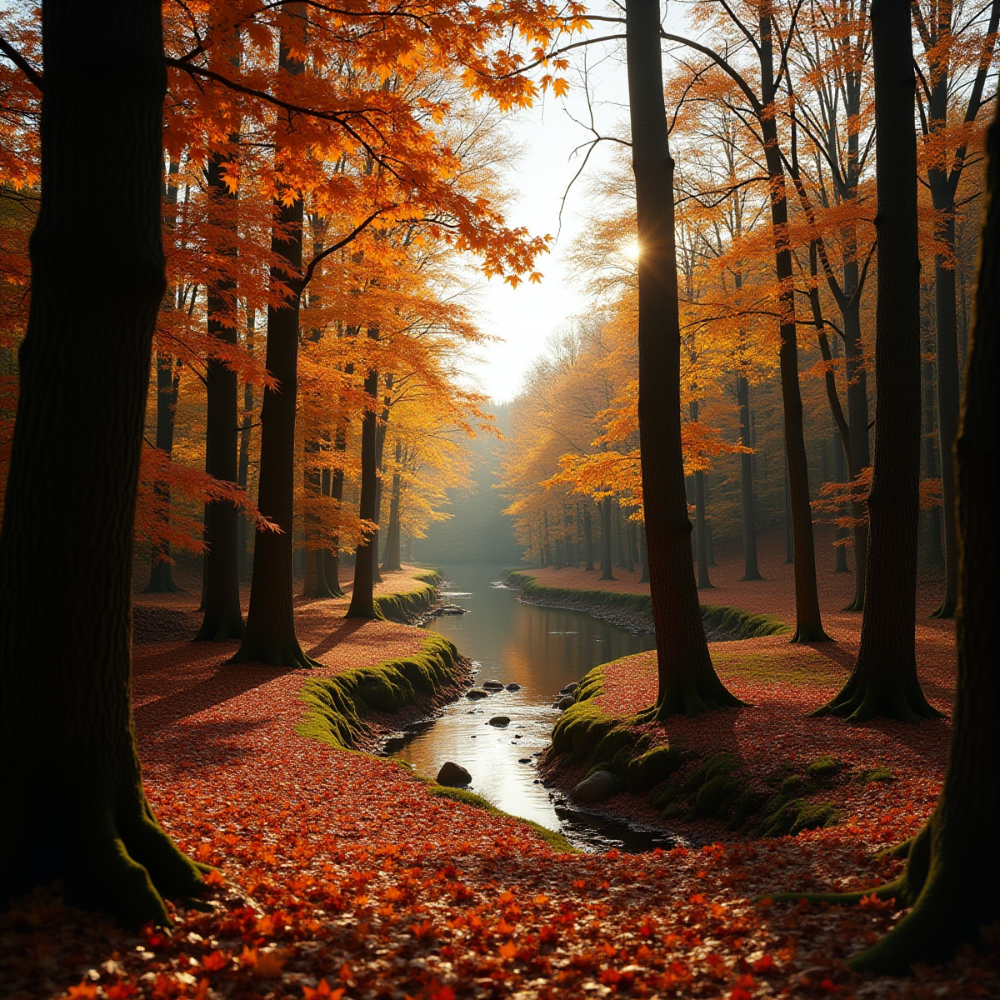

In [3]:
# prompt = """
# A brown big bear walks from the left side, back of the first tree, heading toward the riverbank.
# It steps over the moss-covered ground, rustling leaves.
# The bear reaches the water’s edge, lowers its head, and drinks from the river, causing gentle ripples in the water.
# """

# neg_prompt = """
# More than one bear appears. The bear drinks from the ground.
# The bear doesnt reach the riverbank. The bear's face is not that of a bear.
# Less that 4 legs appears. More that 4 legs appears. The bear is enormous or tiny.
# The bear is very thin.
# """

prompt = """
Animate the scene of a peaceful forest by adding gentle movement to the trees as they sway in the wind.
The river flowing smoothly with ripples across its surface, and the clouds slowly drifting across the sky.
The overall effect should be calm and natural, with the movements complementing the serene environment.
"""

image_name = '0'
image = Image.open(f'Image Generation/FLUX.1 FilmPortrait/{image_name}.png')
image

In [4]:
video = pipe(
    prompt=prompt,
    # negative_prompt=neg_prompt,
    image=image,
    num_inference_steps=40,
    num_frames=49,
    guidance_scale=9.5
).frames[0]

  0%|          | 0/40 [00:00<?, ?it/s]

In [5]:
# Searching pattern that we will apply in the directory
searching_pattern = os.path.join('Video Generation/CogVideoX-5B/', f'*FilmPortrait_{image_name}_Bear_*.mp4')

# Find the matching files and return the number of them
matching_files = glob.glob(searching_pattern)
file_count = len(matching_files)

output_path = f"Video Generation/CogVideoX-5B/FilmPortrait_{image_name}_Bear_{file_count}.mp4"
export_to_video(video, output_path, fps=8)

'Video Generation/CogVideoX-5B/FilmPortrait_0_Bear_3.mp4'

In [6]:
display(Video(output_path, width=700, height=450))

### 3.2 I2VGenXL

In [7]:
pipe = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16").to('cuda')

pipe.enable_sequential_cpu_offload()
pipe.vae.enable_tiling()
pipe.vae.enable_slicing()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

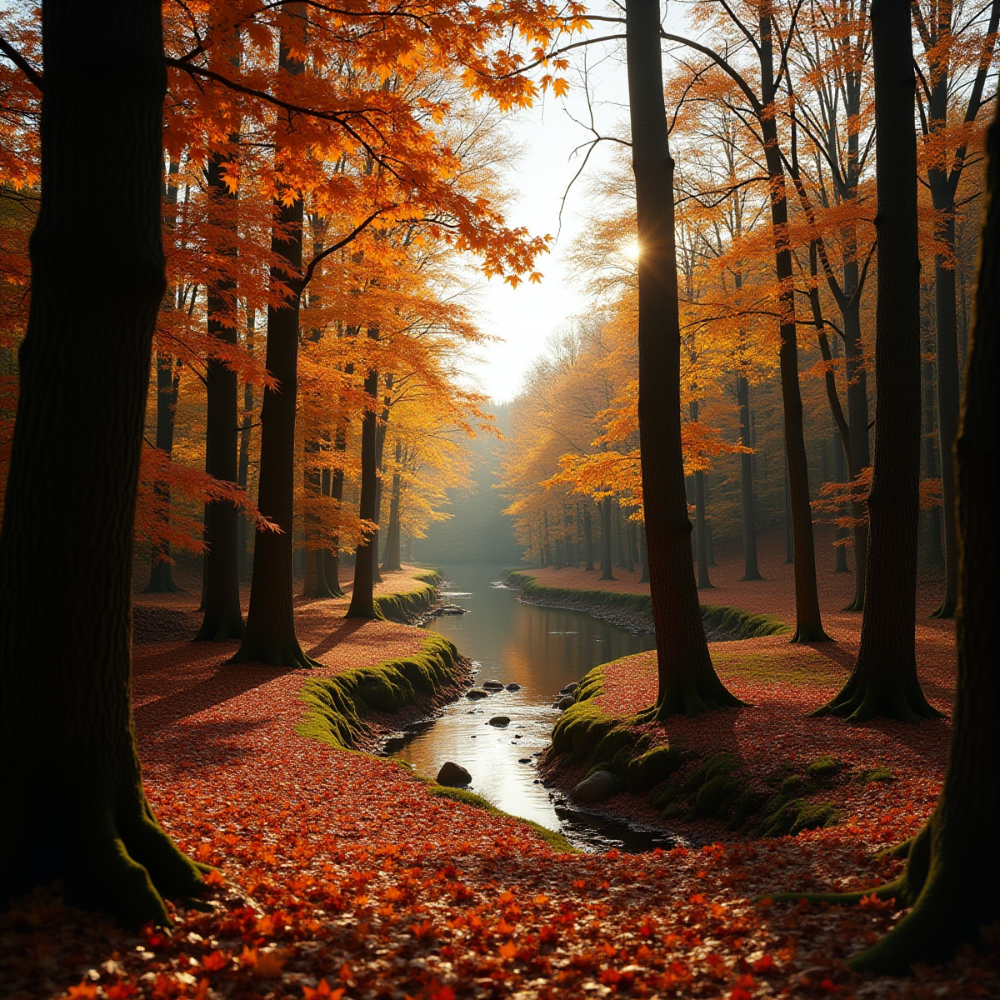

In [8]:
# prompt = "Add some movements in the leaves and the river."

prompt = """
Animate the scene of a peaceful forest by adding gentle movement to the trees as they sway in the wind.
The river flowing smoothly with ripples across its surface, and the clouds slowly drifting across the sky.
The overall effect should be calm and natural, with the movements complementing the serene environment.
"""

# prompt = """
# A brown big bear walks from the left side, back of the first tree, heading toward the riverbank.
# It steps over the moss-covered ground, rustling leaves.
# The bear reaches the water’s edge, lowers its head, and drinks from the river, causing gentle ripples in the water.
# """

image_name = '0'
image = Image.open(f'Image Generation/FLUX.1 FilmPortrait/{image_name}.png')
image

In [9]:
video = pipe(
    prompt=prompt,
    image=image,
    num_frames=16,
    num_inference_steps=50,
    guidance_scale=9
).frames[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [10]:
# Searching pattern that we will apply in the directory
searching_pattern = os.path.join('Video Generation/I2VGenXL/', f'*FilmPortrait_{image_name}_Movements*.mp4')

# Find the matching files and return the number of them
matching_files = glob.glob(searching_pattern)
file_count = len(matching_files)

output_path = f"Video Generation/I2VGenXL/FilmPortrait_{image_name}_Movements{file_count}.mp4"
export_to_video(video, output_path, fps=8)

'Video Generation/I2VGenXL/FilmPortrait_0_Movements1.mp4'

In [11]:
display(Video(output_path, width=700, height=450))

### 3.3 Stable Video Diffusion I2V XT

In [12]:
pipe = StableVideoDiffusionPipeline.from_pretrained("stabilityai/stable-video-diffusion-img2vid-xt", torch_dtype=torch.float16).to('cuda')
pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

StableVideoDiffusionPipeline {
  "_class_name": "StableVideoDiffusionPipeline",
  "_diffusers_version": "0.30.3",
  "_name_or_path": "stabilityai/stable-video-diffusion-img2vid-xt",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    "transformers",
    "CLIPVisionModelWithProjection"
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "unet": [
    "diffusers",
    "UNetSpatioTemporalConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKLTemporalDecoder"
  ]
}

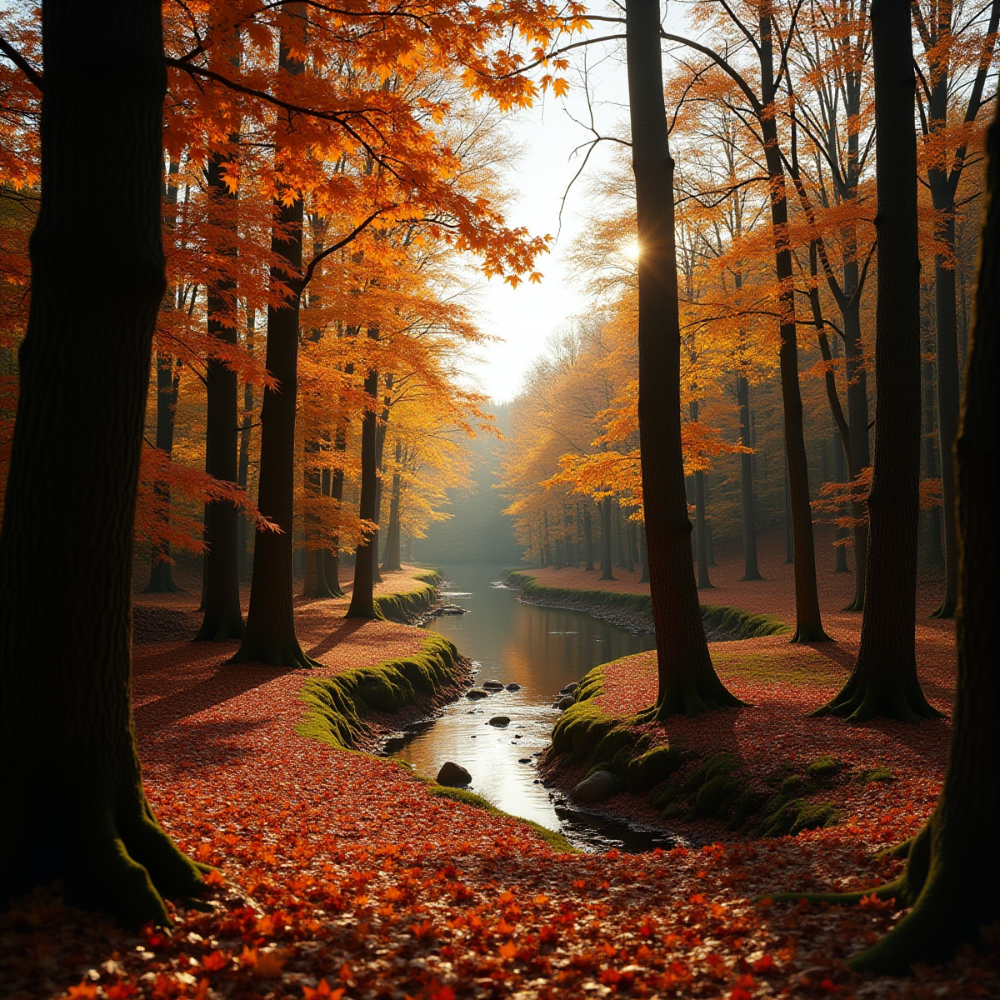

In [13]:
image_name = '0'
image = Image.open(f'Image Generation/FLUX.1 FilmPortrait/{image_name}.png')
image

In [14]:
video = pipe(
    image=image,
    num_frames=25,
    height=576, 
    width=768,
    fps=8,
    generator=torch.manual_seed(42)
).frames[0]

  0%|          | 0/25 [00:00<?, ?it/s]

In [15]:
# Searching pattern that we will apply in the directory
searching_pattern = os.path.join('Video Generation/Stable-Video-Diffusion-I2V-XT/', f'*FilmPortrait_{image_name}_Movements*.mp4')

# Find the matching files and return the number of them
matching_files = glob.glob(searching_pattern)
file_count = len(matching_files)

output_path = f"Video Generation/Stable-Video-Diffusion-I2V-XT/FilmPortrait_{image_name}_Movements_{file_count}.mp4"
export_to_video(video, output_path, fps=8)

'Video Generation/Stable-Video-Diffusion-I2V-XT/FilmPortrait_0_Movements_2.mp4'

In [16]:
display(Video(output_path, width=700, height=450))

## 4. Text to Video Generation

### 4.1 AnimateLCM

In [ ]:
adapter = MotionAdapter.from_pretrained("wangfuyun/AnimateLCM", torch_dtype=torch.float16)
pipe = AnimateDiffPipeline.from_pretrained("emilianJR/epiCRealism", motion_adapter=adapter, torch_dtype=torch.float16).to('cuda')
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config, beta_schedule="linear")

pipe.load_lora_weights("wangfuyun/AnimateLCM", weight_name="AnimateLCM_sd15_t2v_lora.safetensors", adapter_name="lcm-lora")
pipe.set_adapters(["lcm-lora"], [0.8])

In [ ]:
prompt = """
A close look to a kids sad face  near a window a rainning day, 4k, high resolution
"""

In [ ]:
video = pipe(
    prompt=prompt,
    negative_prompt="bad quality, worse quality, low resolution, bad face",
    num_frames=24,
    guidance_scale=1.5,
    num_inference_steps=50,
).frames[0]